In [109]:
import geopandas as gpd
import pandas as pd
import numpy as np

## Geometría links

In [110]:
shapefile_path = '../data/shape_data/Red_Tenerife_link.SHP'
gdf_link = gpd.read_file(shapefile_path)
gdf_link = gdf_link.to_crs(crs="EPSG:4326")
gdf_link.columns

Index(['NO', 'FROMNODENO', 'TONODENO', 'TYPENO', 'TSYSSET', 'LENGTH',
       'NUMLANES', 'CAPPRT', 'V0PRT', 'VOLVEHPR~1', 'VOLPERSP~2', 'VOLPERSW~3',
       'OSM_ELEC~4', 'OSM_GAUGE', 'OSM_LEVEL', 'OSM_MAXS~5', 'OSM_OPER~6',
       'OSM_STRU~7', 'OSM_VOLT~8', 'OSM_WAYS~9', 'OSM_WAY_ID', 'R_NO',
       'R_FROMN~10', 'R_TONODENO', 'R_TYPENO', 'R_TSYSSET', 'R_LENGTH',
       'R_NUMLANES', 'R_CAPPRT', 'R_V0PRT', 'R_VOLVE~11', 'R_VOLPE~12',
       'R_VOLPE~13', 'R_OSM_E~14', 'R_OSM_G~15', 'R_OSM_L~16', 'R_OSM_M~17',
       'R_OSM_O~18', 'R_OSM_S~19', 'R_OSM_V~20', 'R_OSM_W~21', 'R_OSM_W~22',
       'geometry'],
      dtype='object')

In [111]:
columns_drop = ['TYPENO', 'TSYSSET', 'LENGTH',
       'NUMLANES', 'CAPPRT', 'V0PRT', 'VOLVEHPR~1', 'VOLPERSP~2', 'VOLPERSW~3',
       'OSM_ELEC~4', 'OSM_GAUGE', 'OSM_LEVEL', 'OSM_MAXS~5', 'OSM_OPER~6',
       'OSM_STRU~7', 'OSM_VOLT~8', 'OSM_WAYS~9', 'OSM_WAY_ID', 'R_NO',
       'R_FROMN~10', 'R_TONODENO', 'R_TYPENO', 'R_TSYSSET', 'R_LENGTH',
       'R_NUMLANES', 'R_CAPPRT', 'R_V0PRT', 'R_VOLVE~11', 'R_VOLPE~12',
       'R_VOLPE~13', 'R_OSM_E~14', 'R_OSM_G~15', 'R_OSM_L~16', 'R_OSM_M~17',
       'R_OSM_O~18', 'R_OSM_S~19', 'R_OSM_V~20', 'R_OSM_W~21', 'R_OSM_W~22']

gdf_link = gdf_link.drop(columns_drop, axis = 1)
gdf_link

,NO,FROMNODENO,TONODENO,geometry
0,7,12,13,"LINESTRING (-16.2385 28.48406, -16.23864 28.48..."
1,10,18,19,"LINESTRING (-16.67904 28.21434, -16.67904 28.2..."
2,11,20,3864,"LINESTRING (-16.79866 28.24353, -16.79866 28.2..."
3,12,21,3864,"LINESTRING (-16.7986 28.24388, -16.79864 28.24..."
4,13,22,23,"LINESTRING (-16.79886 28.24436, -16.79899 28.2..."
...,...,...,...,...
7232,19609,13931,16079,"LINESTRING (-16.69052 28.07389, -16.69051 28.0..."
7233,19618,1973,16497,"LINESTRING (-16.34695 28.48885, -16.347 28.48878)"
7234,19619,10007,16497,"LINESTRING (-16.3468 28.48835, -16.34691 28.48..."
7235,19620,16186,16498,"LINESTRING (-16.34428 28.48753, -16.34424 28.4..."


In [112]:
gdf_link.explore()

### Buscando puntos de entrada más cercanos

- x: longitud
- y: latitud

In [113]:
shapefile_path = '../data/shape_data/zonas150.SHP'

#Cargamos el shape con las zonas 
gdf_zonas = gpd.read_file(shapefile_path)
gdf_zonas = gdf_zonas.to_crs(crs="EPSG:4326")
gdf_zonas = gdf_zonas[["idZona", "geometry"]]

# Calculamos coordenadas de los centroides
centroid = gdf_zonas["geometry"].centroid
gdf_zonas["longitud"] = centroid.x
gdf_zonas["latitud"] = centroid.y
gdf_zonas

C:\Users\alejandro.gc\AppData\Local\Temp\ipykernel_24740\2605303833.py:9: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroid = gdf_zonas["geometry"].centroid


,idZona,geometry,longitud,latitud
0,120,"POLYGON ((-16.43649 28.39296, -16.43657 28.392...",-16.444232,28.412684
1,119,"POLYGON ((-16.47005 28.43047, -16.47006 28.430...",-16.474732,28.434843
2,118,"POLYGON ((-16.46674 28.44048, -16.46663 28.440...",-16.436477,28.424703
3,106,"POLYGON ((-16.36112 28.52362, -16.361 28.5235,...",-16.355679,28.506234
4,105,"POLYGON ((-16.33938 28.54567, -16.33897 28.545...",-16.336011,28.529154
...,...,...,...,...
145,113,"POLYGON ((-16.42616 28.49984, -16.42612 28.499...",-16.417465,28.486927
146,73,"POLYGON ((-16.28304 28.44856, -16.28304 28.448...",-16.285600,28.448168
147,96,"POLYGON ((-16.32101 28.47737, -16.32156 28.477...",-16.319131,28.480710
148,79,"POLYGON ((-16.30409 28.47062, -16.30382 28.470...",-16.303327,28.468678


In [114]:
gdf_zonas.explore()

In [91]:
# Generamos el nuevo geodataframe con las coordendas como puntos
from shapely import Point

gdf_cent = gdf_zonas[["idZona", "longitud", "latitud"]]
gdf_cent["geometry"] = gdf_cent.apply(lambda row: Point(row.longitud, row.latitud), axis = 1)
gdf_cent = gpd.GeoDataFrame(gdf_cent, geometry= "geometry", crs="EPSG:4326")
gdf_cent = gdf_cent[["idZona", "geometry"]]
gdf_cent

,idZona,geometry
0,120,POINT (-16.44423 28.41268)
1,119,POINT (-16.47473 28.43484)
2,118,POINT (-16.43648 28.4247)
3,106,POINT (-16.35568 28.50623)
4,105,POINT (-16.33601 28.52915)
...,...,...
145,113,POINT (-16.41746 28.48693)
146,73,POINT (-16.2856 28.44817)
147,96,POINT (-16.31913 28.48071)
148,79,POINT (-16.30333 28.46868)


In [92]:
# Buscamos el link más cercano a nuestros centroides
merge_gdf = gdf_cent.sjoin_nearest(gdf_link, distance_col="distances")
merge_gdf

c:\python_envs\geopandas_env\Lib\site-packages\geopandas\array.py:403: UserWarning: Geometry is in a geographic CRS. Results from 'sjoin_nearest' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  warnings.warn(


,idZona,geometry,index_right,NO,FROMNODENO,TONODENO,distances
0,120,POINT (-16.44423 28.41268),2875,6145,7898,7899,0.019880
1,119,POINT (-16.47473 28.43484),2472,4683,5930,12789,0.001810
2,118,POINT (-16.43648 28.4247),2877,6147,4526,7899,0.019645
3,106,POINT (-16.35568 28.50623),4335,9048,7736,7738,0.005590
4,105,POINT (-16.33601 28.52915),823,2382,3309,7893,0.007727
...,...,...,...,...,...,...,...
145,113,POINT (-16.41746 28.48693),3447,7832,8422,9558,0.001280
146,73,POINT (-16.2856 28.44817),450,1140,1648,1649,0.000678
147,96,POINT (-16.31913 28.48071),2686,5503,7141,7142,0.000320
148,79,POINT (-16.30333 28.46868),1007,2833,3971,3972,0.001428


In [93]:
# Como se han encontrado links equidistantes a algunos nodos, nos quedaremos solo con el primer link
# que aparece. Agora tenemos el centroide de cada una de las zonas y su link más cercano
merge_gdf = merge_gdf[["idZona", "geometry", "NO"]].drop_duplicates(subset='idZona', keep='first')
merge_gdf = pd.merge(merge_gdf, gdf_link, on='NO', how='inner')[["idZona", "geometry_x", "NO", "geometry_y"]]
merge_gdf = merge_gdf.rename(columns = {"idZona":"id_centroide",
                                        "geometry_x":"geometry_zone",
                                        "NO":"link_number",
                                        "geometry_y":"geometry_link"})

In [94]:
# Calculamos el punto de entrada para cada link. Punto del link más cercano al centroide.

# Paso 1: convertimos los links a un aray de puntos 
merge_gdf['geometry_y_points'] = merge_gdf['geometry_link'].apply(lambda x: [Point((x_coord, y_coord)) for x_coord in x.xy[0] for y_coord in x.xy[1]])
# Paso 2: calculamos la distancia entre los centroídes y cada uno de los puntos de su link más cercano
merge_gdf['geometry_y_distances'] = merge_gdf.apply(lambda x: [x['geometry_zone'].distance(point) for point in x['geometry_y_points']], axis='columns')
merge_gdf

,id_centroide,geometry_zone,link_number,geometry_link,geometry_y_points,geometry_y_distances
0,120,POINT (-16.44423 28.41268),6145,"LINESTRING (-16.43475 28.39406, -16.43446 28.3...","[POINT (-16.4347548 28.3940565), POINT (-16.43...","[0.020899411177735736, 0.019914512377572045, 0..."
1,119,POINT (-16.47473 28.43484),4683,"LINESTRING (-16.45962 28.44409, -16.45975 28.4...","[POINT (-16.459624 28.4440866), POINT (-16.459...","[0.01771148161609275, 0.017676708900496402, 0...."
2,118,POINT (-16.43648 28.4247),6147,"LINESTRING (-16.39524 28.42993, -16.39727 28.4...","[POINT (-16.3952449 28.4299319), POINT (-16.39...","[0.041562429406207684, 0.04140058580890492, 0...."
3,106,POINT (-16.35568 28.50623),9048,"LINESTRING (-16.36593 28.50275, -16.36565 28.5...","[POINT (-16.3659278 28.5027526), POINT (-16.36...","[0.010823637674908276, 0.01059638049379259, 0...."
4,105,POINT (-16.33601 28.52915),2382,"LINESTRING (-16.33811 28.52165, -16.33802 28.5...","[POINT (-16.3381101 28.521648), POINT (-16.338...","[0.007794497169119794, 0.007770712729792173, 0..."
...,...,...,...,...,...,...
145,113,POINT (-16.41746 28.48693),7832,"LINESTRING (-16.41696 28.48869, -16.41688 28.4...","[POINT (-16.4169586 28.4886872), POINT (-16.41...","[0.0018318346719544483, 0.0017789428350317123,..."
146,73,POINT (-16.2856 28.44817),1140,"LINESTRING (-16.28696 28.44832, -16.2869 28.44...","[POINT (-16.2869568 28.4483221), POINT (-16.28...","[0.0013652194620187522, 0.0013754826495870629,..."
147,96,POINT (-16.31913 28.48071),5503,"LINESTRING (-16.31887 28.48109, -16.31888 28.4...","[POINT (-16.3188731 28.4810909), POINT (-16.31...","[0.00046018978400407564, 0.0004283522220685421..."
148,79,POINT (-16.30333 28.46868),2833,"LINESTRING (-16.30376 28.46732, -16.30399 28.4...","[POINT (-16.3037637 28.4673185), POINT (-16.30...","[0.0014278497932378176, 0.0014388036758421485,..."


In [95]:
# Paso 3: obtenemos el punto de entrada sabiendo que se corresponde con la distancia mínima
merge_gdf['nearest_point'] = merge_gdf.apply(lambda row: row['geometry_y_points'][np.argmin(row['geometry_y_distances'])], axis='columns')
merge_gdf

,id_centroide,geometry_zone,link_number,geometry_link,geometry_y_points,geometry_y_distances,nearest_point
0,120,POINT (-16.44423 28.41268),6145,"LINESTRING (-16.43475 28.39406, -16.43446 28.3...","[POINT (-16.4347548 28.3940565), POINT (-16.43...","[0.020899411177735736, 0.019914512377572045, 0...",POINT (-16.43475 28.40746)
1,119,POINT (-16.47473 28.43484),4683,"LINESTRING (-16.45962 28.44409, -16.45975 28.4...","[POINT (-16.459624 28.4440866), POINT (-16.459...","[0.01771148161609275, 0.017676708900496402, 0....",POINT (-16.47484 28.43478)
2,118,POINT (-16.43648 28.4247),6147,"LINESTRING (-16.39524 28.42993, -16.39727 28.4...","[POINT (-16.3952449 28.4299319), POINT (-16.39...","[0.041562429406207684, 0.04140058580890492, 0....",POINT (-16.4239 28.42486)
3,106,POINT (-16.35568 28.50623),9048,"LINESTRING (-16.36593 28.50275, -16.36565 28.5...","[POINT (-16.3659278 28.5027526), POINT (-16.36...","[0.010823637674908276, 0.01059638049379259, 0....",POINT (-16.35975 28.50614)
4,105,POINT (-16.33601 28.52915),2382,"LINESTRING (-16.33811 28.52165, -16.33802 28.5...","[POINT (-16.3381101 28.521648), POINT (-16.338...","[0.007794497169119794, 0.007770712729792173, 0...",POINT (-16.33716 28.52167)
...,...,...,...,...,...,...,...
145,113,POINT (-16.41746 28.48693),7832,"LINESTRING (-16.41696 28.48869, -16.41688 28.4...","[POINT (-16.4169586 28.4886872), POINT (-16.41...","[0.0018318346719544483, 0.0017789428350317123,...",POINT (-16.41696 28.48694)
146,73,POINT (-16.2856 28.44817),1140,"LINESTRING (-16.28696 28.44832, -16.2869 28.44...","[POINT (-16.2869568 28.4483221), POINT (-16.28...","[0.0013652194620187522, 0.0013754826495870629,...",POINT (-16.28549 28.44832)
147,96,POINT (-16.31913 28.48071),5503,"LINESTRING (-16.31887 28.48109, -16.31888 28.4...","[POINT (-16.3188731 28.4810909), POINT (-16.31...","[0.00046018978400407564, 0.0004283522220685421...",POINT (-16.31889 28.48084)
148,79,POINT (-16.30333 28.46868),2833,"LINESTRING (-16.30376 28.46732, -16.30399 28.4...","[POINT (-16.3037637 28.4673185), POINT (-16.30...","[0.0014278497932378176, 0.0014388036758421485,...",POINT (-16.30376 28.46737)


In [96]:
node_gdf = merge_gdf.copy()
node_gdf = node_gdf[["id_centroide", "geometry_zone", "geometry_link", "nearest_point"]]
node_gdf = node_gdf.rename({"geometry_zone":"centroide_point"}, axis = 1)
node_gdf

,id_centroide,centroide_point,geometry_link,nearest_point
0,120,POINT (-16.44423 28.41268),"LINESTRING (-16.43475 28.39406, -16.43446 28.3...",POINT (-16.43475 28.40746)
1,119,POINT (-16.47473 28.43484),"LINESTRING (-16.45962 28.44409, -16.45975 28.4...",POINT (-16.47484 28.43478)
2,118,POINT (-16.43648 28.4247),"LINESTRING (-16.39524 28.42993, -16.39727 28.4...",POINT (-16.4239 28.42486)
3,106,POINT (-16.35568 28.50623),"LINESTRING (-16.36593 28.50275, -16.36565 28.5...",POINT (-16.35975 28.50614)
4,105,POINT (-16.33601 28.52915),"LINESTRING (-16.33811 28.52165, -16.33802 28.5...",POINT (-16.33716 28.52167)
...,...,...,...,...
145,113,POINT (-16.41746 28.48693),"LINESTRING (-16.41696 28.48869, -16.41688 28.4...",POINT (-16.41696 28.48694)
146,73,POINT (-16.2856 28.44817),"LINESTRING (-16.28696 28.44832, -16.2869 28.44...",POINT (-16.28549 28.44832)
147,96,POINT (-16.31913 28.48071),"LINESTRING (-16.31887 28.48109, -16.31888 28.4...",POINT (-16.31889 28.48084)
148,79,POINT (-16.30333 28.46868),"LINESTRING (-16.30376 28.46732, -16.30399 28.4...",POINT (-16.30376 28.46737)


In [ ]:
# Obtenemos las coordenadas min y máx para la representación del mapa
global_bounds = node_gdf["centroide_point"].total_bounds
min_lon, min_lat, max_lon, max_lat = global_bounds

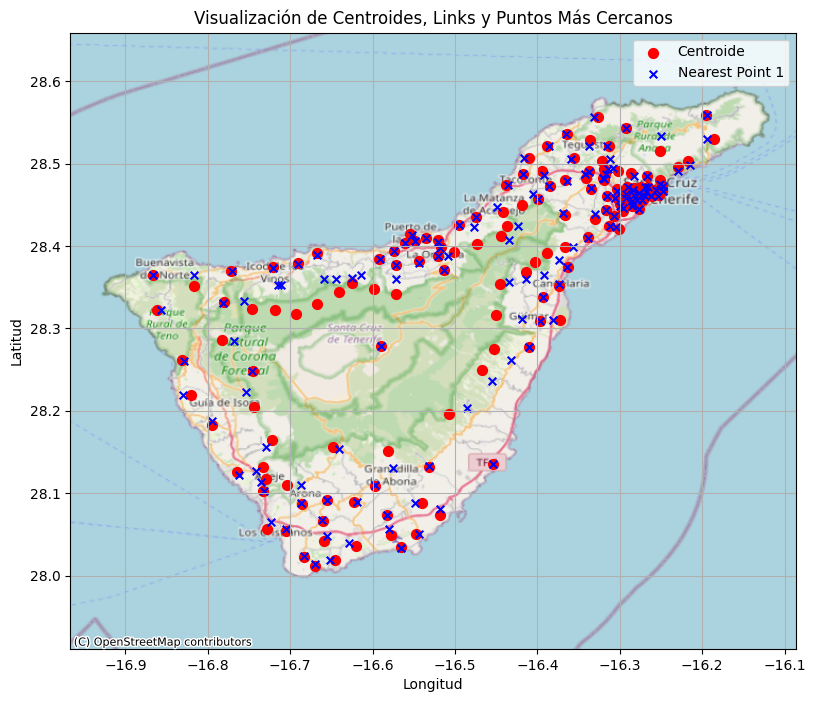

In [86]:
import matplotlib.pyplot as plt

# Verificar si las columnas ya son geometrías de Shapely
if isinstance(node_gdf.iloc[0]['centroide_point'], str):
    # Convertir desde WKT si es texto
    node_gdf['centroide_point'] = gpd.GeoSeries.from_wkt(node_gdf['centroide_point'])
else:
    # Asumir que ya son geometrías válidas
    node_gdf['centroide_point'] = gpd.GeoSeries(node_gdf['centroide_point'])

if isinstance(node_gdf.iloc[0]['nearest_point'], str):
    node_gdf['nearest_point'] = gpd.GeoSeries.from_wkt(node_gdf['nearest_point'])
else:
    node_gdf['nearest_point'] = gpd.GeoSeries(node_gdf['nearest_point'])

# Crear GeoDataFrames para cada tipo de geometría
centroids = gpd.GeoDataFrame(node_gdf[['id_centroide']], geometry=node_gdf['centroide_point'])
nearest_points = gpd.GeoDataFrame(node_gdf[['id_centroide']], geometry=node_gdf['nearest_point'])

centroids.set_crs("EPSG:4326", inplace=True)
nearest_points.set_crs("EPSG:4326", inplace=True)

import contextily as ctx

# Configurar el mapa
fig, ax = plt.subplots(figsize=(12, 8))

global_bounds = node_gdf["centroide_point"].total_bounds

ax.set_xlim(min_lon-0.1, max_lon+0.1)
ax.set_ylim(min_lat-0.1, max_lat+0.1)
ctx.add_basemap(ax, crs="EPSG:4326", source=ctx.providers.OpenStreetMap.Mapnik)

# Dibujar los puntos
centroids.plot(ax=ax, color='red', markersize=50, marker='o', label='Centroide')
nearest_points.plot(ax=ax, color='blue', markersize=30, marker='x', label='Nearest Point 1')

# Ajustes visuales
ax.set_aspect('equal')
plt.title("Visualización de Centroides, Links y Puntos Más Cercanos")
plt.xlabel("Longitud")
plt.ylabel("Latitud")
plt.legend()
plt.grid(True)
plt.show()